In [2]:
from datetime import timedelta, date
from collections import Counter 
import numpy as np 
import matplotlib.pyplot as plt 
from plotly.offline import init_notebook_mode, iplot 
import plotly.graph_objs as go
from plotly import tools

init_notebook_mode(connected=True) 
%matplotlib inline 

### Prime Wednesday Challenge

Create a method which, for any year in the range 1921 to 2233 returns the total number of "prime wednesdays" in that year.

A prime wenesday is a wednesday for which its day of the month is a prime number e.g. Wednesday 7th March 2018

In [3]:
def is_prime_wed(date):
    return (date.day in {2,3,5,7,11,13,17,19,23,29,31}) & (date.weekday() == 2)

def count_prime_weds(year):
    start_date = date(year, 1, 1)
    end_date = date(year, 12, 31)
    
    dates = [start_date + timedelta(n) for n in range((end_date - start_date).days + 1)] 
    
    return sum(1 for date in dates if is_prime_wed(date))

So creathing the method is not particularly difficult, but can we approach this challenge in a different way? **Can we describe the relationship between a year and its number of prime wednedays in a single equation?** In other words, is there a repeating pattern over time?

It turns out there is! We can see this sequence below:

In [4]:
start_year = 1912
end_year = 2233
years = range(start_year, end_year + 1)

prime_weds = [count_prime_weds(year) for year in range(start_year, end_year + 1)]

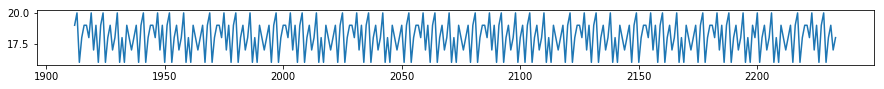

In [5]:
plt.figure(figsize=(15, 1))
plt.plot(years, prime_weds) 
plt.show()

With a fixed number of days in a year this would be a relatively easy pattern to describe, but it is complicated by **leap years**. In particular, the fact that leap years do not always occur every four year. The actual rule is that leap years occur if the year is divisible by 4, unless the year is divisible by 100 but not divisible by 400...

This means there are some subtleties in the above pattern which are not immediately obvious, this will make describing it in a single equation more complicated, but it should still be possible.

Our challenge will be to find the **simplest equation**, that is, the equation with the fewest number of parameters.

### Approach #1: Fourier transform

The first attempt to describe this pattern in an equation will be to create a **Fourier series** from our prime wednesdays sequence. This transform will decompose the sequence into many **sine waves** of different frequencies/amplitude, which can then be summed together to recreate our original sequence.

The output equation from this will be something like `y = a1*sin(f1*x) + a2*sin(f2*x) + a3*sin(f3*x) ...` where `f` is a frequency, `a` is an amplitude, `x` is our input year and `y` is number of prime wednesdays.

To begin we will convert our `x` values to be between 0-1 and subtract a fixed value from our output `y` to centre it on ~0 as this will make plotting easier.

In [6]:
y = np.array(prime_weds) - 18 # centre signal on 0 for clearer freq domain plots 
sf = len(y) # sample frequency
x = np.arange(sf) / sf

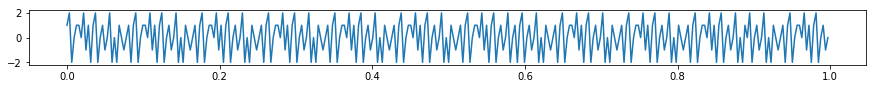

In [7]:
plt.figure(figsize=(15, 1))
plt.plot(x, y) 
plt.show()

We now carry out the fourier transform, and plot the frequency and amplitude of each sine wave, which can later be summed to recreate the original sequence.

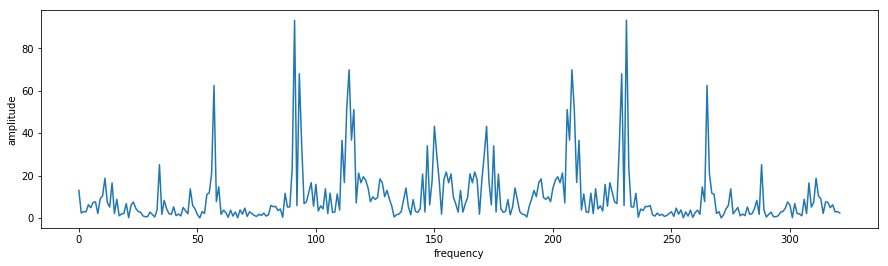

In [8]:
fft_amp = np.fft.fft(y)
fft_freq = np.arange(sf) 

plt.figure(figsize=(15, 4))
plt.plot(fft_freq, abs(fft_amp.real))
plt.xlabel('frequency')
plt.ylabel('amplitude')
plt.show() 

Next we carry our the reverse fourier transform (essentially summing our sine waves) to show that we can recreate the original sequence

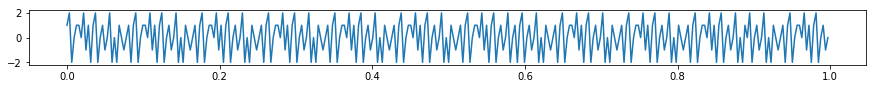

In [9]:
ifft_y = np.fft.ifft(fft_amp).real

plt.figure(figsize=(15, 1))
plt.plot(x, ifft_y)
plt.show() 

Notice on the amplitude vs frequency plot the higher frequencies appear to be a copy of the lower frequencies, mirrored around ~161Hz. This is because these higher frequencies are above the **nyquist** frequency for this series, and it turns out we don't actually need them to be able to carry out our reverse transform.

We will show this below by zeroing all the high frequency components (we also have to doubled the amplitudes of the lower frequencies to compensate for this)

In [10]:
def positive_freq(x):
    '''https://dsp.stackexchange.com/questions/19817''' 
    x = x.copy()
    n = len(x)
    assert n % 2 == 0
    negative = int((n/2)+1) 
    x[negative:] = 0 # mute frequencies > nyquist
    x[1:negative-1] *= 2 # compensate for amplitudes of muted frequencies 
    return x

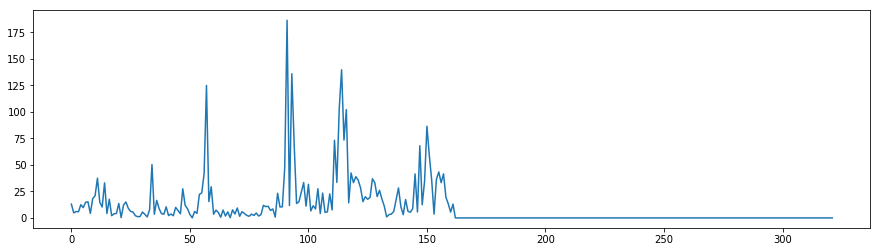

In [11]:
fft_amp_pos = positive_freq(fft_amp)

plt.figure(figsize=(15, 4))
plt.plot(fft_freq, abs(fft_amp_pos.real))
plt.show()

From now on we will only plot the the lower half of the frequencies to make out plots clearer

In [12]:
def truncate(x):
    ''' Truncate frequencies above nyquist'''
    nyquist = int(len(x) / 2) + 1
    return x[:nyquist]

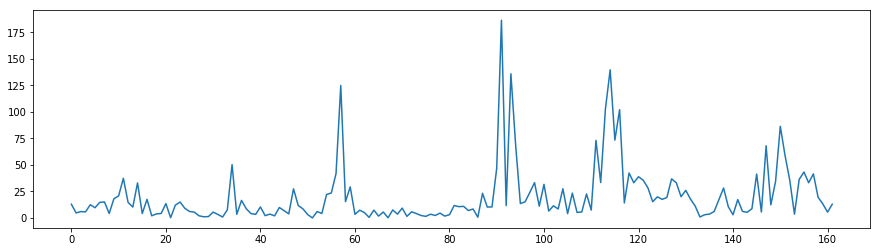

In [13]:
plt.figure(figsize=(15, 4))
plt.plot(truncate(fft_freq), truncate(abs(fft_amp_pos.real)))
plt.show()

Next we will do the reverse fourier transform, this time using only using our remaining frequencies to prove we can recover the original sequence

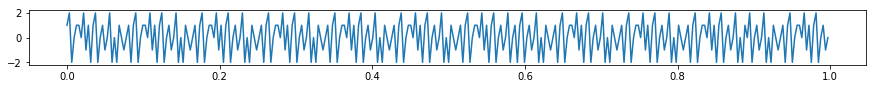

In [14]:
ifft_y_pos = np.fft.ifft(fft_amp_pos).real

plt.figure(figsize=(15, 1))
plt.plot(x, ifft_y_pos)
plt.show()

Hooray. This means straight away we have *halved* the number of parameters in our equation, by dropping all the high frequency sine waves leaving us with *only* 162 parameters. Our equation is getting simpler already!

The next step is to take advantage of the fact that the amplitude of some frequences are much higher, and therfore more important, so it stands to reason that we might not need all of them to be able to create a close estimation of the original sequence. 

In [15]:
def top_n_freq(x, n):
    assert 1 <= n <= len(x)
    x = x.copy()
    indicies = abs(x.real).argsort()[:-n]
    x[indicies] = 0
    return x

We will illustrate this by only retaining the frequencies which have the top 5 amplitudes and carrying out the reverse fourier transform. In the following plots the red series is the one with only 5 frequency components retained.

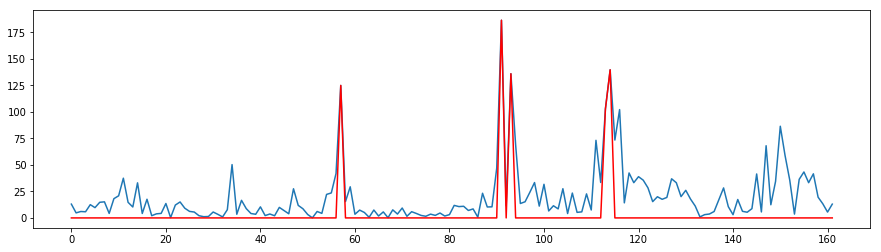

In [16]:
fft_amp_pos_top5 = top_n_freq(fft_amp_pos, n=5)

plt.figure(figsize=(15, 4))
plt.plot(truncate(fft_freq), truncate(abs(fft_amp_pos.real)))
plt.plot(truncate(fft_freq), truncate(abs(fft_amp_pos_top5.real)), c='r')
plt.show()

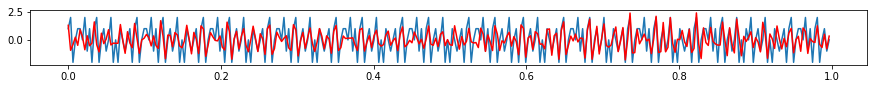

In [17]:
ifft_y_pos_top5 = np.fft.ifft(fft_amp_pos_top5).real

plt.figure(figsize=(15, 1))
plt.plot(x, y)
plt.plot(x, ifft_y_pos_top5, c='r')
plt.show()

So even with only 5 frequency components (5 parameters in our  equation) we can get a *reasonable* estimate of the original sequence. It nots quite good enough but gives us hope that we can get a result that "close enough" with fewer than 162 parameters.

What do we mean by "close enough"? As we are looking for an integer output, as long as the `y` value we return from our equation is < 0.5 from that actual `y` then, after rounding, we will have the correct result.

The interactive plot below lets us move the slider to try different numbers of frequency components, and find the minimum number of required frequencies.

In [38]:
fig = tools.make_subplots(
    rows=3, cols=1,
    subplot_titles=('Frequency Spectrum', 'Signal', 'Residuals'),
    print_grid=False,
    vertical_spacing=0.1
)

# CREATE FIXED TRACES

true_fft = go.Scatter(
    x=truncate(fft_freq),
    y=truncate(abs(fft_amp_pos.real)), 
    line=dict(color='royalblue', width=2), 
    hoverinfo='none'
)
fig.append_trace(true_fft, 1, 1)

true_signal = go.Scatter(
    x=x,
    y=y,
    line=dict(color='royalblue', width=2), 
    hoverinfo='none'
)
fig.append_trace(true_signal, 2, 1)

# CREATE DYNAMIC TRACES

n_freqs = int((len(fft_amp_pos) / 2)  + 1)
n_freqs_step = 2

for n in range(1, n_freqs + 1, n_freqs_step):
    # Frequency Spectrum
    fft_amp_pos
    fft_amp_top = top_n_freq(fft_amp_pos, n=n)
    fig.append_trace(go.Scatter(
        x=truncate(fft_freq),
        y=truncate(abs(fft_amp_top.real)),
        line=dict(color='red', width=2),
        visible=False, 
        hoverinfo='none'),
    1, 1)
    
    # Signal (Inverse FFT)
    ifft_signal = np.fft.ifft(fft_amp_top).real
    fig.append_trace(go.Scatter(
        x=x,
        y=ifft_signal,
        line=dict(color='red', width=2),
        visible=False, 
        hoverinfo='none'),
    2, 1)
    
    # Residuals
    residuals = ifft_signal - y
    res_filter = abs(residuals) < 0.5 # filter residuals outside limit and plot as separate trace
    res_good, res_bad = residuals.copy(), residuals.copy()
    res_good[~res_filter] = 0
    res_bad[res_filter] = 0
    fig.append_trace(go.Bar(
        x=x,
        y=res_good,
        marker=dict(color='darkgrey'),
        visible=False, 
        hoverinfo='none'),
    3, 1)
    fig.append_trace(go.Bar(
        x=x,
        y=res_bad,
        marker=dict(color='black'),
        visible=False, 
        hoverinfo='none'),
    3, 1)
    
# CREATE STEPS FOR SLIDER

steps = []
fixed_traces = 2
step_size = 4 # number of traces to update in each "step"
dynamic_traces = len(fig['data']) - fixed_traces 
default_step = 4

for i, n in enumerate(range(fixed_traces, dynamic_traces, step_size)): 
    step = dict(
        method = 'restyle',
        args = ['visible', [True] * fixed_traces + [False] * dynamic_traces],
        label=str((i * n_freqs_step) + 1)
    )
    # set traces in current "group" to be visible 
    for substep in range(step_size): 
        step['args'][1][n+substep] = True 
        # make default dynamic traces visible (should be handled by slider['active']? but does not seem to work)
        if i == default_step: fig['data'][n+substep]['visible'] = True
    steps.append(step)

sliders = [dict(
    active = default_step,
    currentvalue = {"prefix": "Number of Frequencies: "},
    pad = {"t": 50},
    steps = steps
)]

fig['layout'].update(height=700, width=800)
fig['layout']['yaxis1']['zeroline'] = False
fig['layout']['yaxis1'].update(range=[0, 200])
fig['layout']['yaxis2'].update(range=[-3, 3])
fig['layout']['yaxis3'].update(range=[-3, 3])
fig['layout']['sliders'] = sliders
fig['layout']['showlegend'] = False
fig['layout']['margin'] =go.Margin(l=0, r=0, b=150, t=50, pad=4)
    
iplot(fig, filename='make-subplots-multiple-with-titles')

The "Residuals" plot shows the difference between the actual `y` value and the value we get from the reverse fourier transform (comparing the traces in the "Signal" plot). The grey bars represent differences which are smaller than our required threshold of 0.5 and black bars are >= 0.5.

We are looking for the smallest number of frequencies which leaves us with no black bars, and by adjusting the slider we can see this is **~111**.

We will now try a different approach in **Part 2** of the notebook